# Table of Contents

### 1 Imports
### 2 Configuration
### 3 Load Data
### 4 Exploratory Data Analysis
### 5 Subsample the Training Data
### 6 Examining the Columns
### 7 Outlier Analysis

# 1. Imports

In [1]:
print("\n... PIP INSTALLS STARTING ...\n")
!pip install -q --upgrade tensorflow-io
try:
    import mediapipe as mp
except:
    !pip install -q mediapipe
    import mediapipe as mp
print("\n... PIP INSTALLS COMPLETE ...\n")


print("\n... IMPORTS STARTING ...\n")
print("\n\tVERSION INFORMATION")
# Competition Specific Imports (You'll see why we need these later)
# mediapipe above

# Machine Learning and Data Science Imports (basics)
import tensorflow as tf; 
import pandas as pd; pd.options.mode.chained_assignment = None; pd.set_option('display.max_columns', None);
import numpy as np;
import sklearn;

# Built-In Imports (mostly don't worry about these)
from kaggle_datasets import KaggleDatasets
from glob import glob
import IPython
import urllib
import random
import json
import sys
import io
import os

# Visualization Imports (overkill)
from matplotlib.animation import FuncAnimation
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
import matplotlib.patches as patches
import plotly.graph_objects as go
from IPython.display import HTML
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm; tqdm.pandas();
import plotly.express as px
import tifffile as tif
import seaborn as sns
from PIL import Image, ImageEnhance; Image.MAX_IMAGE_PIXELS = 5_000_000_000;
import matplotlib as mpl;
import plotly
import math
import PIL

import plotly.io as pio
print(pio.renderers)

def seed_it_all(seed=7):
    """ Attempt to be Reproducible """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

seed_it_all()

print("\n\n... IMPORTS COMPLETE ...\n")


... PIP INSTALLS STARTING ...

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.
tensorflow-transform 1.12.0 requires pyarrow<7,>=6, but you have pyarrow 5.0.0 which is incompatible.
tensorflow-serving-api 2.11.0 requires protobuf<3.20,>=3.9.2, but you have protobuf 3.20.3 which is incompatible.

... PIP INSTALLS COMPLETE ...


... IMPORTS STARTING ...


	VERSION INFORMATION


/opt/conda/lib/python3.7/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.7/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.7/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_18SourceLocationImplE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.7/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.7/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.7/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN3tsl13Gcs

Renderers configuration
-----------------------
    Default renderer: 'kaggle'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']



... IMPORTS COMPLETE ...



In [2]:
# Helper Functions

def read_json_file(file_path):
    """Read a JSON file and parse it into a Python object.

    Args:
        file_path (str): The path to the JSON file to read.

    Returns:
        dict: A dictionary object representing the JSON data.
        
    Raises:
        FileNotFoundError: If the specified file path does not exist.
        ValueError: If the specified file path does not contain valid JSON data.
    """
    try:
        # Open the file and load the JSON data into a Python object
        with open(file_path, 'r') as file:
            json_data = json.load(file)
        return json_data
    except FileNotFoundError:
        # Raise an error if the file path does not exist
        raise FileNotFoundError(f"File not found: {file_path}")
    except ValueError:
        # Raise an error if the file does not contain valid JSON data
        raise ValueError(f"Invalid JSON data in file: {file_path}")
        
        
        
def get_sign_df(pq_path, invert_y=True):
    sign_df = pd.read_parquet(pq_path)
    
    # y value is inverted (Thanks @danielpeshkov)
    if invert_y: sign_df["y"] *= -1 
        
    return sign_df
        
    
    
    
def plot_event(event_df, style="full"):
    # Create figure and animation
    fig, ax = plt.subplots()
    l, = ax.plot([], [])
    animation = FuncAnimation(fig, func=lambda x: animation_frame(x, event_df, ax, style=style), 
                              frames=event_df["frame"].unique())
    
    # Display animation as HTML5 video
    return HTML(animation.to_html5_video())




def animation_frame(f, event_df, ax, ax_pad=0.2, style="full", 
                    face_color="spring", pose_color="autumn", lh_color="winter", rh_color="summer"):
    """
    Function called by FuncAnimation to animate the plot with the provided frame.

    Args:
        f (int): The current frame number.

    Returns:
        None.
    """
    
    face_color = plt.cm.get_cmap(face_color)
    pose_color = plt.cm.get_cmap(pose_color)
    rh_color = plt.cm.get_cmap(rh_color)
    lh_color = plt.cm.get_cmap(lh_color)
    
    sign_df = event_df.copy()
    
    # Clear axis and fix the axis
    ax.clear()
    if style=="full":
        xmin = sign_df['x'].min() - ax_pad
        xmax = sign_df['x'].max() + ax_pad
        ymin = sign_df['y'].min() - ax_pad
        ymax = sign_df['y'].max() + ax_pad
    elif style=="hands":
        xmin = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['x'].min() - ax_pad
        xmax = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['x'].max() + ax_pad
        ymin = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['y'].min() - ax_pad
        ymax = sign_df[sign_df.type.isin(["left_hand", "right_hand"])]['y'].max() + ax_pad
    else:
        xmin = sign_df[sign_df.type==style]['x'].min() - ax_pad
        xmax = sign_df[sign_df.type==style]['x'].max() + ax_pad
        ymin = sign_df[sign_df.type==style]['y'].min() - ax_pad
        ymax = sign_df[sign_df.type==style]['y'].max() + ax_pad
    
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.axis(False) # Remove the axis lines
    
    # Normalize depth
    zmin, zmax = sign_df['z'].min(), sign_df['z'].max()
    sign_df['z'] = (sign_df['z']-zmin)/(zmax-zmin)
    
    # Get data for current frame
    frame = sign_df[sign_df.frame==f]
    
    # Left Hand
    if style.lower() in ["left_hand", "hands", "full"]:
        left = frame[frame.type=='left_hand']
        lx, ly, lz = get_hand_points(left)
        for i in range(len(lx)):
            if type(lx[i])!=np.float64:
                lh_clr = [lh_color(((np.abs(_x)+np.abs(_y))/2)) for _x, _y in zip(lx[i], ly[i])]
                lh_clr = tuple(sum(_x)/len(_x) for _x in zip(*lh_clr))
            else: 
                lh_clr = lh_color(((np.abs(lx[i])+np.abs(ly[i]))/2))
            ax.plot(lx[i], ly[i], color=lh_clr, alpha=lz[i].mean())
    
    # Right Hand
    if style.lower() in ["right_hand", "hands", "full"]:
        right = frame[frame.type=='right_hand']
        rx, ry, rz = get_hand_points(right)
        for i in range(len(rx)):
            if type(rx[i])!=np.float64:
                rh_clr = [rh_color((np.abs(_x)+np.abs(_y))/2) for _x, _y in zip(rx[i], ry[i])] 
                rh_clr = tuple(sum(_x)/len(_x) for _x in zip(*rh_clr))
            else:
                rh_clr = rh_color(((np.abs(rx[i])+np.abs(ry[i]))/2))
            ax.plot(rx[i], ry[i], color=rh_clr, alpha=rz[i].mean())
    
    # Pose
    if style.lower() in ["pose", "full"]:
        pose = frame[frame.type=='pose']
        px, py, pz = get_pose_points(pose)
        for i in range(len(px)):
            if type(px[i])!=np.float64:
                pose_clr = [pose_color(((np.abs(_x)+np.abs(_y))/2)) for _x, _y in zip(px[i], py[i])]
                pose_clr = tuple(sum(_x)/len(_x) for _x in zip(*pose_clr))
            else: 
                pose_clr = pose_color(((np.abs(px[i])+np.abs(py[i]))/2))
            ax.plot(px[i], py[i], color=pose_clr, alpha=pz[i].mean())
        
    if style.lower() in ["face", "full"]:
        face = frame[frame.type=='face'][['x', 'y', 'z']].values
        fx, fy, fz = face[:,0], face[:,1], face[:,2]
        for i in range(len(fx)):
            ax.plot(fx[i], fy[i], '.', color=pose_color(fz[i]), alpha=fz[i])
    
    # Use this so we don't get an extra return
    plt.close()
    
    
    
    
def get_hand_points(hand):
    """Return x, y lists of normalized spatial coordinates for each finger in the hand dataframe."""
    def __get_hand_ax(_axis):
        return [np.nan_to_num(_x) for _x in 
            [hand.iloc[i][_axis] for i in range(5)]+\
            [[hand.iloc[i][_axis] for i in range(j, j+4)] for j in range(5, 21, 4)]+\
            [hand.iloc[i][_axis] for i in special_pts]]
    special_pts = [0, 5, 9, 13, 17, 0]
    return [__get_hand_ax(_ax) for _ax in ['x','y','z']]




def get_pose_points(pose):
    """
    Extracts x and y coordinates from the provided dataframe for pose landmarks.

    Args:
        pose (pandas.DataFrame): Dataframe containing pose landmarks with columns ['x', 'y', 'z', 'visibility', 'presence'].

    Returns:
        tuple: Two lists of x and y coordinates, respectively.

    """
    def __get_pose_ax(_axis):
        return [np.nan_to_num(_x) for _x in [
            [pose.iloc[i][_axis] for i in [8, 6, 5, 4, 0, 1, 2, 3, 7]], 
            [pose.iloc[i][_axis] for i in [10, 9]], 
            [pose.iloc[i][_axis] for i in [22, 16, 20, 18, 16, 14, 12, 11, 13, 15, 17, 19, 15, 21]], 
            [pose.iloc[i][_axis] for i in [12, 24, 26, 28, 30, 32, 28]], 
            [pose.iloc[i][_axis] for i in [11, 23, 25, 27, 29, 31, 27]], 
            [pose.iloc[i][_axis] for i in [24, 23]]
        ]]
    return [__get_pose_ax(_ax) for _ax in ['x','y','z']]




# Prints Shape and Dtype For List Of Variables
def print_shape_dtype(l, names):
    for e, n in zip(l, names):
        print(f'{n} shape: {e.shape}, dtype: {e.dtype}')
        
                
        
        
# Get complete file path to file
def get_file_path(path):
    return f'/kaggle/input/asl-signs/{path}'



# 2. Configuration

In [3]:
# If True, processing data from scratch
# If False, loads preprocessed data
PREPROCESS_DATA = False
TRAIN_MODEL = True
# True: use 10% of participants as validation set
# False: use all data for training -> gives better LB result
USE_VAL = False

N_ROWS = 543
N_DIMS = 3
DIM_NAMES = ['x', 'y', 'z']
SEED = 42
NUM_CLASSES = 250
IS_INTERACTIVE = os.environ['KAGGLE_KERNEL_RUN_TYPE'] == 'Interactive'
VERBOSE = 1 if IS_INTERACTIVE else 2

# INPUT_SIZE = 64

# BATCH_ALL_SIGNS_N = 4
# BATCH_SIZE = 256
# N_EPOCHS = 100
# LR_MAX = 1e-3
# N_WARMUP_EPOCHS = 0
# WD_RATIO = 0.05
# MASK_VAL = 4237

# Plot Config

In [4]:
# MatplotLib Global Settings
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['axes.titlesize'] = 24

# 3. Load data

In [5]:
# Define the path to the root data directory
DATA_DIR         = "/kaggle/input/asl-signs"
EXTEND_TRAIN_DIR = "/kaggle/input/gislr-extended-train-dataframe" 

print("\n... BASIC DATA SETUP STARTING ...\n")
print("\n\n... LOAD TRAIN DATAFRAME FROM CSV FILE ...\n")

LOAD_EXTENDED = True
if LOAD_EXTENDED and os.path.isfile(os.path.join(EXTEND_TRAIN_DIR, "extended_train.csv")):
    train_df = pd.read_csv(os.path.join(EXTEND_TRAIN_DIR, "extended_train.csv"))
else:
    train_df = pd.read_csv(os.path.join(DATA_DIR, "train.csv"))
    train_df["path"] = DATA_DIR+"/"+train_df["path"]
display(train_df)

print("\n\n... LOAD SIGN TO PREDICTION INDEX MAP FROM JSON FILE ...\n")
s2p_map = {k.lower():v for k,v in read_json_file(os.path.join(DATA_DIR, "sign_to_prediction_index_map.json")).items()}
p2s_map = {v:k for k,v in read_json_file(os.path.join(DATA_DIR, "sign_to_prediction_index_map.json")).items()}
encoder = lambda x: s2p_map.get(x.lower())
decoder = lambda x: p2s_map.get(x)
print(s2p_map)

DEMO_ROW = 283
print(f"\n\n... DEMO SIGN/EVENT DATAFRAME FOR ROW {DEMO_ROW} - SIGN={train_df.iloc[DEMO_ROW]['sign']} ...\n")
demo_sign_df = get_sign_df(train_df.iloc[DEMO_ROW]["path"])
display(demo_sign_df)

plot_event(demo_sign_df)


... BASIC DATA SETUP STARTING ...



... LOAD TRAIN DATAFRAME FROM CSV FILE ...



,path,participant_id,sequence_id,sign,start_frame,end_frame,total_frames,face_count,face_nan_count,pose_count,pose_nan_count,left_hand_count,left_hand_nan_count,right_hand_count,right_hand_nan_count,x_min,x_max,y_min,y_max,z_min,z_max
0,/kaggle/input/asl-signs/train_landmark_files/2...,26734,1000035562,blow,20,42,23,10764,0,759,0,483,483,483,252,-0.031811,1.294350,-2.147826,-0.224151,-2.782624,1.910815
1,/kaggle/input/asl-signs/train_landmark_files/2...,28656,1000106739,wait,29,39,11,5148,0,363,0,231,231,231,189,-0.017062,1.015931,-2.222732,-0.329273,-2.543970,1.627621
2,/kaggle/input/asl-signs/train_landmark_files/1...,16069,100015657,cloud,103,207,105,49140,0,3465,0,2205,1617,2205,2205,-0.042923,1.197836,-2.591290,-0.248094,-2.838325,1.587503
3,/kaggle/input/asl-signs/train_landmark_files/2...,25571,1000210073,bird,17,28,12,5616,0,396,0,252,252,252,0,-0.129268,1.156573,-2.294936,-0.310272,-3.018237,2.196296
4,/kaggle/input/asl-signs/train_landmark_files/6...,62590,1000240708,owie,22,39,18,8424,0,594,0,378,378,378,0,0.072425,1.165405,-2.264609,-0.405282,-2.970331,1.360011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94472,/kaggle/input/asl-signs/train_landmark_files/5...,53618,999786174,white,64,112,49,22932,0,1617,0,1029,1029,1029,546,0.031721,1.183957,-2.561170,-0.297828,-3.287074,2.400607
94473,/kaggle/input/asl-signs/train_landmark_files/2...,26734,999799849,have,36,41,6,2808,0,198,0,126,126,126,84,-0.149159,1.310044,-2.170514,-0.177696,-2.678213,1.494088
94474,/kaggle/input/asl-signs/train_landmark_files/2...,25571,999833418,flower,1,37,37,17316,0,1221,0,777,777,777,294,0.057847,0.977379,-2.460778,-0.223186,-3.220553,2.083376
94475,/kaggle/input/asl-signs/train_landmark_files/2...,29302,999895257,room,9,42,34,15912,0,1122,0,714,714,714,588,-0.045806,0.985802,-2.081611,-0.325751,-2.036529,2.350194




... LOAD SIGN TO PREDICTION INDEX MAP FROM JSON FILE ...

{'tv': 0, 'after': 1, 'airplane': 2, 'all': 3, 'alligator': 4, 'animal': 5, 'another': 6, 'any': 7, 'apple': 8, 'arm': 9, 'aunt': 10, 'awake': 11, 'backyard': 12, 'bad': 13, 'balloon': 14, 'bath': 15, 'because': 16, 'bed': 17, 'bedroom': 18, 'bee': 19, 'before': 20, 'beside': 21, 'better': 22, 'bird': 23, 'black': 24, 'blow': 25, 'blue': 26, 'boat': 27, 'book': 28, 'boy': 29, 'brother': 30, 'brown': 31, 'bug': 32, 'bye': 33, 'callonphone': 34, 'can': 35, 'car': 36, 'carrot': 37, 'cat': 38, 'cereal': 39, 'chair': 40, 'cheek': 41, 'child': 42, 'chin': 43, 'chocolate': 44, 'clean': 45, 'close': 46, 'closet': 47, 'cloud': 48, 'clown': 49, 'cow': 50, 'cowboy': 51, 'cry': 52, 'cut': 53, 'cute': 54, 'dad': 55, 'dance': 56, 'dirty': 57, 'dog': 58, 'doll': 59, 'donkey': 60, 'down': 61, 'drawer': 62, 'drink': 63, 'drop': 64, 'dry': 65, 'dryer': 66, 'duck': 67, 'ear': 68, 'elephant': 69, 'empty': 70, 'every': 71, 'eye': 72, 'face': 73, '

,frame,row_id,type,landmark_index,x,y,z
0,23,23-face-0,face,0,0.381393,-0.377334,-0.045009
1,23,23-face-1,face,1,0.387510,-0.333088,-0.060799
2,23,23-face-2,face,2,0.384334,-0.349668,-0.037500
3,23,23-face-3,face,3,0.377555,-0.302792,-0.038101
4,23,23-face-4,face,4,0.388338,-0.322209,-0.062246
...,...,...,...,...,...,...,...
9226,39,39-right_hand-16,right_hand,16,NaN,NaN,NaN
9227,39,39-right_hand-17,right_hand,17,NaN,NaN,NaN
9228,39,39-right_hand-18,right_hand,18,NaN,NaN,NaN
9229,39,39-right_hand-19,right_hand,19,NaN,NaN,NaN


In [6]:
train_df.sort_values(by="total_frames", ascending=False).head(1)
long_sign_df = get_sign_df(train_df.sort_values(by="total_frames", ascending=False).path.values[0])
plot_event(long_sign_df, style="hands")

# 4. Exploratory Data Analysis

In [7]:
# Read Training Data
train = pd.read_csv('/kaggle/input/asl-signs/train.csv')

N_SAMPLES = len(train)
print(f'N_SAMPLES: {N_SAMPLES}')

train['file_path'] = train['path'].apply(get_file_path)

N_SAMPLES: 94477


## Ordinally Encode Sign

In [8]:
# Add ordinally Encoded Sign (assign number to each sign name)
train['sign_ord'] = train['sign'].astype('category').cat.codes

# Dictionaries to translate sign <-> ordinal encoded sign
SIGN2ORD = train[['sign', 'sign_ord']].set_index('sign').squeeze().to_dict()
ORD2SIGN = train[['sign_ord', 'sign']].set_index('sign_ord').squeeze().to_dict()

display(train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94477 entries, 0 to 94476
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   path            94477 non-null  object
 1   participant_id  94477 non-null  int64 
 2   sequence_id     94477 non-null  int64 
 3   sign            94477 non-null  object
 4   file_path       94477 non-null  object
 5   sign_ord        94477 non-null  int16 
dtypes: int16(1), int64(2), object(3)
memory usage: 3.8+ MB


None

## Video Statistics

In [9]:
N = int(1e3) if (IS_INTERACTIVE or not PREPROCESS_DATA) else int(10e3)
N_UNIQUE_FRAMES = np.zeros(N, dtype=np.uint16)
N_MISSING_FRAMES = np.zeros(N, dtype=np.uint16)
MAX_FRAME = np.zeros(N, dtype=np.uint16)

PERCENTILES = [0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99, 0.999]

for idx, file_path in enumerate(tqdm(train['file_path'].sample(N, random_state=SEED))):
    df = pd.read_parquet(file_path)
    N_UNIQUE_FRAMES[idx] = df['frame'].nunique()
    N_MISSING_FRAMES[idx] = (df['frame'].max() - df['frame'].min()) - df['frame'].nunique() + 1
    MAX_FRAME[idx] = df['frame'].max()

  0%|          | 0/1000 [00:00<?, ?it/s]

,N_UNIQUE_FRAMES
count,1000.00000
mean,38.38200
std,45.21228
min,2.00000
1%,6.00000
5%,6.00000
25%,12.00000
50%,21.00000
75%,44.00000
95%,133.05000


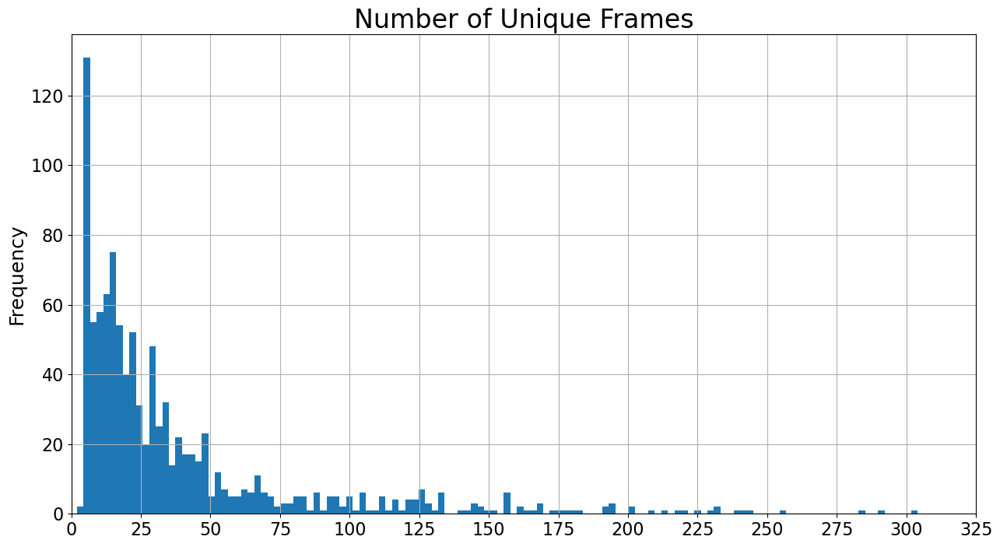

In [10]:
# Number of unique frames in each video
display(pd.Series(N_UNIQUE_FRAMES).describe(percentiles=PERCENTILES).to_frame('N_UNIQUE_FRAMES'))

plt.figure(figsize=(15,8))
plt.title('Number of Unique Frames', size=24)
pd.Series(N_UNIQUE_FRAMES).plot(kind='hist', bins=128)
plt.grid()
xlim = math.ceil(plt.xlim()[1])
plt.xlim(0, xlim)
plt.xticks(np.arange(0, xlim+25, 25))
plt.show()

,MAX_FRAME
count,1000.000000
mean,67.844000
std,59.563138
min,2.000000
1%,12.000000
5%,21.950000
25%,33.000000
50%,43.000000
75%,64.000000
95%,202.050000


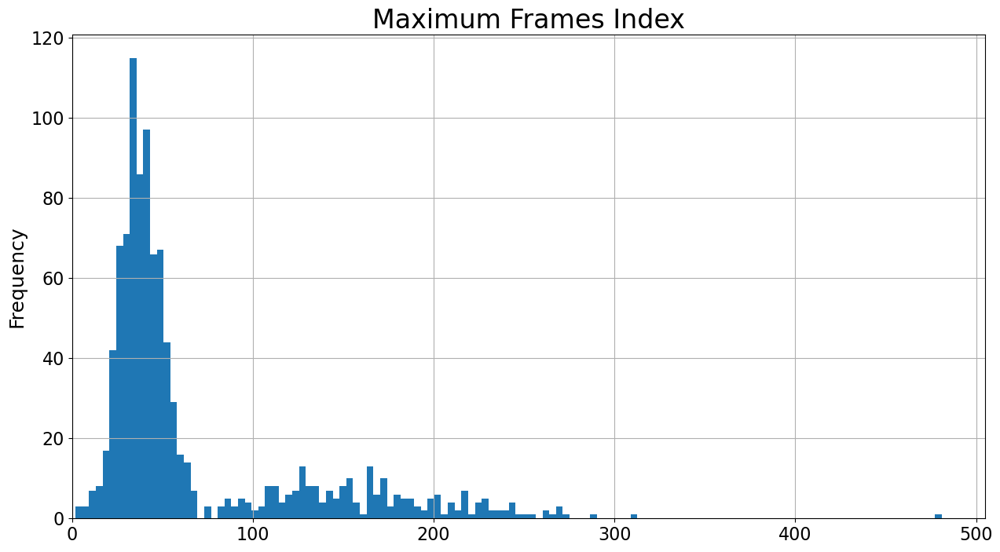

In [11]:
# Maximum frame number
display(pd.Series(MAX_FRAME).describe(percentiles=PERCENTILES).to_frame('MAX_FRAME'))

plt.figure(figsize=(15,8))
plt.title('Maximum Frames Index', size=24)
pd.Series(MAX_FRAME).plot(kind='hist', bins=128)
plt.grid()
plt.xlim(0, math.ceil(plt.xlim()[1]))
plt.show()

# 5. Subsample the train data
---
##### Initially we will sample approximately 10% of the data to probe, as it is very computationally expensive to open and close all the parquet files. Following my interactive EDA I will switch this percentage to be 100% and allow it to run overnight.
* We will then use the subsampled dataset along with the original to explore the columns and respective parquet files for each isolated sign

In [12]:
# During interactive --> 0.001 (0.1%)
# Save and run-all   --> 1.000 (100%)

PCT_TO_EXAMINE = 0.001
if PCT_TO_EXAMINE < 1.0:
    subsample_train_df = train_df.sample(frac=PCT_TO_EXAMINE, random_state=42).reset_index(drop=True)
else:
    subsample_train_df = train_df.copy()

# Remove extra columns to show what we're doing
subsample_train_df=subsample_train_df[["path", "participant_id", "sequence_id", "sign"]]
display(subsample_train_df)

,path,participant_id,sequence_id,sign
0,/kaggle/input/asl-signs/train_landmark_files/2...,28656,3311214787,sticky
1,/kaggle/input/asl-signs/train_landmark_files/5...,53618,3588192588,before
2,/kaggle/input/asl-signs/train_landmark_files/4...,4718,1363575346,pretty
3,/kaggle/input/asl-signs/train_landmark_files/3...,37779,951199059,hen
4,/kaggle/input/asl-signs/train_landmark_files/3...,36257,283190141,tomorrow
...,...,...,...,...
89,/kaggle/input/asl-signs/train_landmark_files/2...,22343,2499821466,pizza
90,/kaggle/input/asl-signs/train_landmark_files/3...,30680,2427202243,farm
91,/kaggle/input/asl-signs/train_landmark_files/5...,53618,532239954,outside
92,/kaggle/input/asl-signs/train_landmark_files/4...,4718,3232372656,water


# 6. Examining the Columns

### Examining the 'PATH' Column
---

There's not much here. The path column is simply the path to the landmark file (parquet).
* Every row and respective filepath is unique
* Every path is comprised of.
    * The base part of the path --> **`/kaggle/input/asl-signs/train_landmark_files`**
    * The <b><code>participant_id</code></b> --> .../16069
    * The <b><code>sequence_id</code></b> as the parquet filename --> .../100015657.parquet
    

In [13]:
print("\n... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:")
display(train_df["path"].describe().to_frame())


... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:


,path
count,94477
unique,94477
top,/kaggle/input/asl-signs/train_landmark_files/2...
freq,1


### Examining the 'PARTICIPANT_ID' Column
---

<ul>
    <li><b>Number Participants</b>: 21</li>
    <li><b>Average Number of Rows Per Participant</b>: 4498.91</li>
    <li><b>Standard Deviation in Counts Per Participant</b>: 490.77</li>
    <li><b>Minimum Number of Examples For One Participant</b>: 3338</li>
    <li><b>Maximum Number of Examples For One Participant</b>: 4968</li>
</ul>

It's also worth pointing out that the folders in the train_landmark_files directory are named based on the participant_id for whom the respective isolated sign event parquet files are for.

### Examine the 'PARTICIPANT_ID' Column
---

<ul>
    <li><b>Number Participants</b>: 21</li>
    <li><b>Average Number of Rows Per Participant</b>: 4498.91</li>
    <li><b>Standard Deviation in Counts Per Participant</b>: 490.77</li>
    <li><b>Minimum Number of Examples For One Participant</b>: 3338</li>
    <li><b>Maximum Number of Examples For One Participant</b>: 4968</li>
</ul>

It's also worth pointing out that the folders in the train_landmark_files directory are named based on the participant_id for whom the respective isolated sign event parquet files are for.

In [14]:
print("\n... BASICS OF THE PARTICIPANT ID COLUMN:\n")
display(train_df["participant_id"].astype(str).describe().to_frame().T)

print("\n... WE GET THE COUNT MAP AND GET BASIC STATISTICS:")
participant_count_map = train_df["participant_id"].value_counts().to_dict()
print("\t1. Number of Unique Participants                  -->", len(participant_count_map))
print("\t2. Average Number of Rows Per Participant         -->", np.array(list(participant_count_map.values())).mean())
print("\t3. Standard Deviation in Counts Per Participant   -->", np.array(list(participant_count_map.values())).std())
print("\t4. Minimum Number of Examples For One Participant -->", np.array(list(participant_count_map.values())).min())
print("\t5. Maximum Number of Examples For One Participant -->", np.array(list(participant_count_map.values())).max())

print("\n\n... PARTICIPANT ID COLUMN HISTOGRAM:\n")
fig = px.histogram(
    train_df, x=train_df["participant_id"].astype(str), color="participant_id",
    labels={"x":"<b>Participant ID</b>", "count":"<b>Total Row Count</b>"}, title="<b>Row Counts by Participant ID</b>",
    category_orders={"participant_id": train_df["participant_id"].value_counts().index}
)
fig.update_yaxes(title_text="<b>Total Row Count</b>")
fig.update_layout(showlegend=False)
fig.show()

print("\n... GOING FORWARD WE SET THIS COLUMN TO BE A STRING")
train_df["participant_id"] = train_df["participant_id"].astype(str)
subsample_train_df["participant_id"] = subsample_train_df["participant_id"].astype(str)


... BASICS OF THE PARTICIPANT ID COLUMN:



,count,unique,top,freq
participant_id,94477,21,49445,4968



... WE GET THE COUNT MAP AND GET BASIC STATISTICS:
	1. Number of Unique Participants                  --> 21
	2. Average Number of Rows Per Participant         --> 4498.9047619047615
	3. Standard Deviation in Counts Per Participant   --> 490.7731417304649
	4. Minimum Number of Examples For One Participant --> 3338
	5. Maximum Number of Examples For One Participant --> 4968


... PARTICIPANT ID COLUMN HISTOGRAM:




... GOING FORWARD WE SET THIS COLUMN TO BE A STRING


### Examine the 'SEQUENCE_ID' column
---

There's not much here. This is a unique value assigned to every isolated sequence/event. One sequence corresponds to a single isolated sign that we have to detect and label.
* Every value is unique for every row


In [15]:
print("\n... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:")
display(train_df["sequence_id"].astype(str).describe().to_frame())

print("\n... TO CONFIRM... LET'S CHECK HOW MANY PARQUET FILES WE HAVE:")
print("\t--> ", len(glob(os.path.join(DATA_DIR, "**", "**", "*.parquet"))))


... LETS LOOK AT THE PATH COLUMN AND ENSURE ALL PATHS ARE UNIQUE:


,sequence_id
count,94477
unique,94477
top,1000035562
freq,1



... TO CONFIRM... LET'S CHECK HOW MANY PARQUET FILES WE HAVE:
	-->  94477


### Examine the 'SIGN' column
---

<b>This is the <span style="color: #FC796D;"><u>label</u></span> for each respective event/sequence.</b>
    
<ul>
    <li><b>Number Of Unique Signs</b>: 250</li>
    <li><b>Average Number of Rows Per Sign</b>: 377.908</li>
    <li><b>Standard Deviation in Counts Per Sign</b>: 19.356537293638034</li>
    <li><b>Minimum Number of Examples For One Sign</b>: 299</li>
    <li><b>Maximum Number of Examples For One Sign</b>: 415</li>
</ul>

It's a pretty balanced dataset!

In [16]:
print("\n... BASICS OF THE PARTICIPANT ID COLUMN:\n")
display(train_df["sign"].describe().to_frame().T)

print("\n... WE GET THE COUNT MAP AND GET BASIC STATISTICS:")
sign_count_map = train_df["sign"].value_counts().to_dict()
print("\t1. Number Of Unique Signs                  -->", len(sign_count_map))
print("\t2. Average Number of Rows Per Sign         -->", np.array(list(sign_count_map.values())).mean())
print("\t3. Standard Deviation in Counts Per Sign   -->", np.array(list(sign_count_map.values())).std())
print("\t4. Minimum Number of Examples For One Sign -->", np.array(list(sign_count_map.values())).min())
print("\t5. Maximum Number of Examples For One Sign -->", np.array(list(sign_count_map.values())).max())

print("\n\n... SIGN COLUMN HISTOGRAM:\n")
fig = px.histogram(train_df, y=train_df["sign"], color="sign", orientation="h", height=5000,
    labels={"y":"<b>Sign (label)</b>", "count":"<b>Total Row Count</b>"}, title="<b>Row Counts by Sign (label)</b>",
    category_orders={"sign": train_df["sign"].value_counts().index}
)
fig.update_yaxes(title_text="<b>Total Row Count</b>")
fig.update_layout(showlegend=False)
fig.show()


... BASICS OF THE PARTICIPANT ID COLUMN:



,count,unique,top,freq
sign,94477,250,listen,415



... WE GET THE COUNT MAP AND GET BASIC STATISTICS:
	1. Number Of Unique Signs                  --> 250
	2. Average Number of Rows Per Sign         --> 377.908
	3. Standard Deviation in Counts Per Sign   --> 19.356537293638034
	4. Minimum Number of Examples For One Sign --> 299
	5. Maximum Number of Examples For One Sign --> 415


... SIGN COLUMN HISTOGRAM:



## Including sequence metadata in Train Dataframe
---

<b>We are going to identify certain pieces of relevant metadata that we want to scrape from the parquet files and include in our main dataframe</b>

<br>

<b><u>We will retrieve the following for each sequence</u></b>
<ul>
    <li>start_frame</li>
    <li>end_frame</li>
    <li>total_frames</li>
    <li>face_count</li>
    <li>pose_count</li>
    <li>left_hand_count</li>
    <li>right_hand_count</li>
    <li>x_min</li>
    <li>x_max</li>
    <li>y_min</li>
    <li>y_max</li>
    <li>z_min</li>
    <li>z_max</li>
</ul>

<br>

<b>What can we observe about the sequences with this new metadata:</b>
<ul>
    <li><b>There are always the same keypoints present</b></li>
    <li>For each part of the body ('type') we have the following keypoint counts:<ul>
        <li>Right Hand --> 21 Keypoints</li>
        <li>Left Hand  --> 21 Keypoints</li>
        <li>Pose --> 33 Keypoints</li>
        <li>Face --> 468 Keypoints</li></ul>
    </li>
    <li><b>Sequences can start almost anywhere</b> from frame 0 to frame 484 but the <b>mean is ~30</b></li>
    <li><b>Sequences can end almost anywhere</b> from frame 1 to frame 499 but the <b>mean is ~67</b></li>
    <li><b>Sequences can be different lengths (and are inclusive of their bounds)</b> from a length of 2 to a length of <font color="red">500</font>. Sequences have a <b>mean length of ~37.5</b></li>
</ul>

In [17]:
def get_seq_meta(row, invert_y=True, do_counts=False):
    """Calculates and adds metadata to the given row of sign language event data.
    """
    # Extract the sign language event data from the Parquet file at the given path
    df = get_sign_df(row['path'], invert_y=invert_y)
    
    # Count the number of landmarks in each type
    type_counts = df['type'].value_counts(dropna=False).to_dict()
    nan_counts  = df.groupby("type")["x"].apply(lambda x: x.isna().sum())
    
    # Calculate metadata for the event and add it to the input row
    row['start_frame'] = df['frame'].min()
    row['end_frame'] = df['frame'].max()
    row['total_frames'] = df['frame'].nunique()
    
    if do_counts:
        for _type in ["face", "pose", "left_hand", "right_hand"]:
            row[f'{_type}_count'] = type_counts[_type]
            row[f'{_type}_nan_count'] = nan_counts[_type]
        
    for coord in ['x', 'y', 'z']:
        row[f'{coord}_min'] = df[coord].min()
        row[f'{coord}_max'] = df[coord].max()
    
    return row

type_kp_map = dict(face=468, left_hand=21, pose=33, right_hand=21)
col_order = [
    'path', 'participant_id', 'sequence_id', 'sign', 'start_frame', 'end_frame', 'total_frames', 
    'face_nan_count', 'face_nan_pct', 'left_hand_nan_count', 'left_hand_nan_pct', 'pose_nan_count', 'pose_nan_pct',
    'right_hand_nan_count', 'right_hand_nan_pct', 'x_min', 'x_max', 'y_min', 'y_max', 'z_min', 'z_max',
]

if not LOAD_EXTENDED:
    # Will take around 5-10 minutes on subsample and around 50-100 minutes on the full dataset
    subsample_train_df = subsample_train_df.progress_apply(lambda x: get_seq_meta(x, do_counts=True), axis=1)
    for _type, _count in type_kp_map.items():
        subsample_train_df[f"{_type}_appears_pct"] = subsample_train_df[f"{_type}_count"]/(subsample_train_df[f"total_frames"]*_count)
        subsample_train_df[f"{_type}_nan_pct"]     = subsample_train_df[f"{_type}_nan_count"]/(subsample_train_df[f"total_frames"]*_count)
    # Extended save for later...
    subsample_train_df.to_csv("extended_train.csv", index=False)
    display(subsample_train_df)
else:
    del subsample_train_df
    for _type, _count in type_kp_map.items():
            train_df[f"{_type}_appears_pct"] = train_df[f"{_type}_count"]/(train_df[f"total_frames"]*_count)
            train_df[f"{_type}_nan_pct"]     = train_df[f"{_type}_nan_count"]/(train_df[f"total_frames"]*_count)
    train_df = train_df[col_order]
    display(train_df)

,path,participant_id,sequence_id,sign,start_frame,end_frame,total_frames,face_nan_count,face_nan_pct,left_hand_nan_count,left_hand_nan_pct,pose_nan_count,pose_nan_pct,right_hand_nan_count,right_hand_nan_pct,x_min,x_max,y_min,y_max,z_min,z_max
0,/kaggle/input/asl-signs/train_landmark_files/2...,26734,1000035562,blow,20,42,23,0,0.0,483,1.000000,0,0.0,252,0.521739,-0.031811,1.294350,-2.147826,-0.224151,-2.782624,1.910815
1,/kaggle/input/asl-signs/train_landmark_files/2...,28656,1000106739,wait,29,39,11,0,0.0,231,1.000000,0,0.0,189,0.818182,-0.017062,1.015931,-2.222732,-0.329273,-2.543970,1.627621
2,/kaggle/input/asl-signs/train_landmark_files/1...,16069,100015657,cloud,103,207,105,0,0.0,1617,0.733333,0,0.0,2205,1.000000,-0.042923,1.197836,-2.591290,-0.248094,-2.838325,1.587503
3,/kaggle/input/asl-signs/train_landmark_files/2...,25571,1000210073,bird,17,28,12,0,0.0,252,1.000000,0,0.0,0,0.000000,-0.129268,1.156573,-2.294936,-0.310272,-3.018237,2.196296
4,/kaggle/input/asl-signs/train_landmark_files/6...,62590,1000240708,owie,22,39,18,0,0.0,378,1.000000,0,0.0,0,0.000000,0.072425,1.165405,-2.264609,-0.405282,-2.970331,1.360011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94472,/kaggle/input/asl-signs/train_landmark_files/5...,53618,999786174,white,64,112,49,0,0.0,1029,1.000000,0,0.0,546,0.530612,0.031721,1.183957,-2.561170,-0.297828,-3.287074,2.400607
94473,/kaggle/input/asl-signs/train_landmark_files/2...,26734,999799849,have,36,41,6,0,0.0,126,1.000000,0,0.0,84,0.666667,-0.149159,1.310044,-2.170514,-0.177696,-2.678213,1.494088
94474,/kaggle/input/asl-signs/train_landmark_files/2...,25571,999833418,flower,1,37,37,0,0.0,777,1.000000,0,0.0,294,0.378378,0.057847,0.977379,-2.460778,-0.223186,-3.220553,2.083376
94475,/kaggle/input/asl-signs/train_landmark_files/2...,29302,999895257,room,9,42,34,0,0.0,714,1.000000,0,0.0,588,0.823529,-0.045806,0.985802,-2.081611,-0.325751,-2.036529,2.350194


<b>The following plot shows the general distributions (independently plotted).</b>
* <b>Note the Y axis is log scale.</b>
* 0.0 (Left Side) - Indicates that no values are missing
* 1.0 (Right Side) - Indicates that all values are missing

<br>

<b>Quick Takeaways</b>
* Face points can be NaN although it is less common than in the Hand data
* Pose points are never NaN
* Left and Right hand distributions are similar but Right Hand is full NaN less than Left Hand
* Pose, Left-Hand, and Right-Hand all have intermediate (not all missing or all present) sequences, however, they are less common than the case where all points are NaN or valid.

In [18]:
def title_map_fn(ann):
    title_map = {
    'face_nan_pct': '<b>Percentage Of <i>Face</i> Data Points That Are NaN</b>', 
    'left_hand_nan_pct': '<b>Percentage Of <i>Left Hand</i> Data Points That Are NaN</b>',
    'pose_nan_pct': '<b>Percentage Of <i>Pose</i> Data Points That Are NaN</b>',
    'right_hand_nan_pct': '<b>Percentage Of <i>Right Hand</i> Data Points That Are NaN</b>'}
    ann.text = title_map.get(ann.text[1:])
    
fig = px.histogram(train_df, ["face_nan_pct", "left_hand_nan_pct", "pose_nan_pct", "right_hand_nan_pct"], height=750,
                   labels={'variable': '', 'count': '<b>Frequency (LOG)</b>', 'value':"<b>Percentage of Points That Are NaN</b>"}, log_y=True, facet_col='variable', nbins=20, opacity=0.75,
                   facet_col_wrap=2, facet_col_spacing=0.05)
fig.update_yaxes(title_text='<b>Frequency (LOG)</b>', col=1)
fig.for_each_annotation(title_map_fn)
fig.update_layout(showlegend=False)
fig.show()

In [19]:
# # Check that all the frames in all the files have the same ordering
# for _path in tqdm(train_df.sample(n=500, random_state=42).reset_index(drop=True)["path"].values, total=500):
#     for _frame_types in get_sign_df(_path).groupby("frame")["type"].apply(list).values:
#         current_idx = 0
#         face_check = _frame_types[current_idx:current_idx+type_kp_map["face"]].count("face")==type_kp_map["face"]
#         current_idx+=type_kp_map["face"]
#         if not face_check:
#             print("face")
#             raise ValueError()
#         lh_check   = _frame_types[current_idx:current_idx+type_kp_map["left_hand"]].count("left_hand")==type_kp_map["left_hand"]
#         current_idx+=type_kp_map["left_hand"]
#         if not lh_check:
#             print("lh")
#             raise ValueError()
#         pose_check = _frame_types[current_idx:current_idx+type_kp_map["pose"]].count("pose")==type_kp_map["pose"]
#         current_idx+=type_kp_map["pose"]
#         if not pose_check:
#             print("pose")
#             raise ValueError()
#         rh_check   = _frame_types[current_idx:current_idx+type_kp_map["right_hand"]].count("right_hand")==type_kp_map["right_hand"]
#         if not rh_check:
#             print("rh")
#             raise ValueError()

# Landmark IDs start at 0 for each respective type and count up
FRAME_TYPE_ORDER_DETAIL = demo_sign_df.groupby("frame")["type"].apply(list).values[0]
FRAME_TYPE_ORDER = sorted(set(FRAME_TYPE_ORDER_DETAIL))
print(FRAME_TYPE_ORDER)
print(type_kp_map)

FRAME_TYPE_IDX_MAP = {
    "face"       : np.arange(0, 468),
    "left_hand"  : np.arange(468, 489),
    "pose"       : np.arange(489, 522),
    "right_hand" : np.arange(522, 543),
}
for k,v in FRAME_TYPE_IDX_MAP.items():
    print(k, FRAME_TYPE_ORDER_DETAIL[v[0]:v[1]].count(k)==(v[1]-v[0]))

['face', 'left_hand', 'pose', 'right_hand']
{'face': 468, 'left_hand': 21, 'pose': 33, 'right_hand': 21}
face True
left_hand True
pose True
right_hand True


# 7. Outlier Analysis
---

<b>In this section we are going to look to see if we can detect outliers for any of the relevant variables</b>

<b>THE FOLLOWING COLUMNS/VARS DO NOT HAVE SIGNIFICANT OUTLIERS</b>
<ul>
    <li>Path</li>
    <li>Participant ID</li>
    <li>Sequence ID</li>
    <li>Sign</li>
</ul>

<b>THE FOLLOWING ANALYSIS PERTAINS TO FRAME INFORMATION AND SEQUENCE LENGTH</b>

<ul>
    <li>In general the lower bound does not seem to be enough of an outlier here to be concerning... frame placement and counts always bottom out around 0-2. This is fine</li>
    <li>The upper bound has some weirdness
        <ul>
            <li>The vast majority are within the bottom 90%</li>
        </ul>
    </li>
</ul>

In [20]:
# Create a box plot
fig = px.box(train_df, y=['start_frame', 'end_frame', 'total_frames'],
             title='<b>Box Plot of Start Frame, End Frame, and Total Frames</b>')

# Customize the box and whisker colors and width
fig.update_traces(boxmean=True)

# Customize the x and y axis labels
fig.update_xaxes(title_text='<b>Frame Measure</b>')
fig.update_yaxes(title_text='<b>Number of Frames</b>')

# Show the plot
fig.show()

In [21]:
long_seqs     = train_df[train_df.total_frames>train_df.total_frames.quantile(0.9)]
notlong_seqs = train_df[train_df.total_frames<=train_df.total_frames.quantile(0.9)]

long_seq_distribution = {k:v/len(long_seqs) for k,v in long_seqs.sign.value_counts().items()}
notlong_seq_distribution = {k:v/len(notlong_seqs) for k,v in notlong_seqs.sign.value_counts().items()}
print("\n... COMPARE DISTRIBUTIONS:")
for i, k in enumerate(sorted(train_df.sign.unique())):
    if i==0: print(f"\n\t{'SIGN':<15} -->  LONG  vs. OTHER \n{'-'*50}")
    print(f"\t{k:<15} --> {long_seq_distribution.get(k, 0.0):.4f} vs. {notlong_seq_distribution.get(k, 0.0):.4f}")


... COMPARE DISTRIBUTIONS:

	SIGN            -->  LONG  vs. OTHER 
--------------------------------------------------
	TV              --> 0.0037 vs. 0.0041
	after           --> 0.0030 vs. 0.0037
	airplane        --> 0.0058 vs. 0.0040
	all             --> 0.0046 vs. 0.0040
	alligator       --> 0.0053 vs. 0.0040
	animal          --> 0.0046 vs. 0.0036
	another         --> 0.0033 vs. 0.0040
	any             --> 0.0027 vs. 0.0039
	apple           --> 0.0051 vs. 0.0039
	arm             --> 0.0038 vs. 0.0038
	aunt            --> 0.0052 vs. 0.0040
	awake           --> 0.0042 vs. 0.0043
	backyard        --> 0.0047 vs. 0.0039
	bad             --> 0.0031 vs. 0.0041
	balloon         --> 0.0055 vs. 0.0040
	bath            --> 0.0032 vs. 0.0038
	because         --> 0.0043 vs. 0.0042
	bed             --> 0.0037 vs. 0.0037
	bedroom         --> 0.0057 vs. 0.0039
	bee             --> 0.0039 vs. 0.0042
	before          --> 0.0027 vs. 0.0039
	beside          --> 0.0029 vs. 0.0033
	better          --> 0.